In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
# data
import pandas as pd
import numpy as np
import datetime
from math import ceil

# plots
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

# processing
from sklearn.impute import KNNImputer
from collections import Counter
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, OneHotEncoder
from sklearn.base import clone

#Normalizing 
from sklearn.preprocessing import RobustScaler


# chi-square
import scipy.stats as stats
from scipy.stats import chi2_contingency

# models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.linear_model import LogisticRegression, LassoCV
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from pprint import pprint
from sklearn import svm
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.model_selection import GridSearchCV,  RandomizedSearchCV, cross_val_score, RepeatedStratifiedKFold
from sklearn.model_selection import StratifiedKFold

# metrics
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn import metrics
from sklearn.metrics import f1_score, classification_report, confusion_matrix


# multidimensional visualization methods
from matplotlib import pyplot
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import graphviz
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
sns.set()
%matplotlib inline

In [3]:
#Always display all columns
pd.set_option('display.max_columns', None)
# read the dataset
df = pd.read_csv('H2.csv')

In [4]:
df_final=pd.read_csv('cleaned_data.csv')
df_test_final=pd.read_csv('cleaned_test_data.csv')

In [5]:
df_final=df_final.drop(['Unnamed: 0','ArrivalDate'], axis=1)

In [6]:
df_test_final=df_test_final.drop(['Unnamed: 0','ArrivalDate'], axis=1)

In [7]:
y_train=df_final['IsCanceled']
y_test=df_test_final['IsCanceled']
X_train=df_final.drop('IsCanceled', axis=1)
X_test=df_test_final.drop('IsCanceled', axis=1)

### Model Assessment functions: 

In [8]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    """
    import itertools
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Confusion matrix")
    else:
        print('Confusion matrix')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Test states')
    plt.xlabel('Predicted states')
    plt.tight_layout()

In [9]:
def metrics(y_train, pred_train , y_val, pred_val):
    """
    Function that pritns the classification report and the confusion matrix of the train and validation dataset
    """
    print('___________________________________________________________________________________________________________')
    print('                                                     TRAIN                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train, pred_train))
    print(confusion_matrix(y_train, pred_train))


    print('___________________________________________________________________________________________________________')
    print('                                                TEST                                                       ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val, pred_val))
    print(confusion_matrix(y_val, pred_val))

## K-nearest neighbor

In [30]:
#Do not run
error_rate = []

for i in range(1,30):
    
    modelKNN = KNeighborsClassifier(n_neighbors=i)
    modelKNN.fit(X_train,y_train)
    pred_i = modelKNN.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

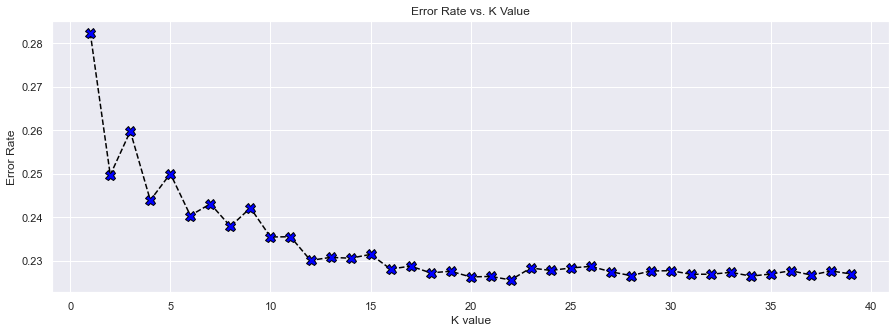

In [32]:
#Do not run
plt.figure(figsize=(15,5))
plt.plot(range(1,30),error_rate,color='black', linestyle='dashed', marker='X',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K value')
plt.ylabel('Error Rate')

In [38]:
knn = KNeighborsClassifier(n_neighbors=22, metric='manhattan')
knn.fit(X = X_train, y = y_train)
test_labels = knn.predict(X_test)
train_labels=knn.predict(X_train)

In [39]:
metrics(y_train, train_labels , y_test, test_labels)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.93      0.87     26158
           1       0.75      0.50      0.60     11227

    accuracy                           0.80     37385
   macro avg       0.78      0.72      0.73     37385
weighted avg       0.79      0.80      0.79     37385

[[24253  1905]
 [ 5575  5652]]
___________________________________________________________________________________________________________
                                                TEST                                                       
------------------------------------------------------------------------------------------------------

Confusion matrix
[[10210  1004]
 [ 2573  2241]]


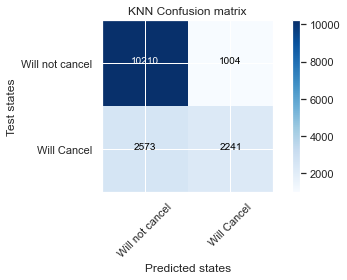

In [40]:
cnf_matrix = confusion_matrix(y_test, test_labels)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Will not cancel', 'Will Cancel'],
                      title='KNN Confusion matrix')

## Logistic Regression: 

In [45]:
LG = LogisticRegression()
grid_values = {'penalty': ['l1', 'l2'],'C':[0.001,.009,0.01,.09,1,5,10,25]}
grid_lg = GridSearchCV(estimator = LG, param_grid = grid_values,scoring = 'f1', cv = 5, verbose=2, n_jobs = -1)
grid_lg.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.001, 0.009, 0.01, 0.09, 1, 5, 10, 25],
                         'penalty': ['l1', 'l2']},
             scoring='f1', verbose=2)

In [46]:
#Get best param: 
grid_lg.best_params_

{'C': 1, 'penalty': 'l2'}

In [47]:
lg = grid_lg.best_estimator_
lg.fit(X = X_train, y = y_train)
test_labels = lg.predict(X_test)
train_labels=lg.predict(X_train)

In [48]:
metrics(y_train, train_labels , y_test, test_labels)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.80      0.91      0.85     26158
           1       0.69      0.48      0.56     11227

    accuracy                           0.78     37385
   macro avg       0.75      0.69      0.71     37385
weighted avg       0.77      0.78      0.76     37385

[[23746  2412]
 [ 5876  5351]]
___________________________________________________________________________________________________________
                                                TEST                                                       
------------------------------------------------------------------------------------------------------

Confusion matrix
[[10137  1077]
 [ 2551  2263]]


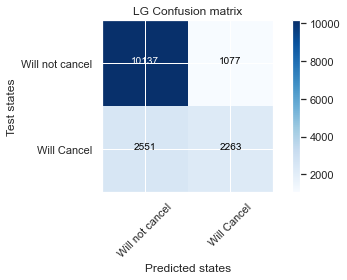

In [49]:
cnf_matrix = confusion_matrix(y_test, test_labels)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Will not cancel', 'Will Cancel'],
                      title='LG Confusion matrix')

## Decision Tree: 

In [52]:
DT = DecisionTreeClassifier()

# Number of features to consider at every split
max_features = ['None','auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,200]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
#max_leaf_nodes
max_leaf_nodes=[5]
max_leaf_nodes.append(None)
#Criterion:
criterion= ['entropy', 'gini']
#Splitter: 
splitter= ['best', 'random']
# Create the random grid
DT_grid_par = {
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'max_leaf_nodes':max_leaf_nodes,
              'criterion': criterion, 
              'splitter': splitter
}
pprint(DT_grid_par)

{'criterion': ['entropy', 'gini'],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['None', 'auto', 'sqrt'],
 'max_leaf_nodes': [5, None],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10, 200],
 'splitter': ['best', 'random']}


In [53]:
DT_grid = GridSearchCV(estimator = DT,
                          param_grid=DT_grid_par, 
                          scoring = 'f1',
                           cv = 3, verbose=2,  n_jobs = -1
                         )
# Fit the grid search model
DT_grid.fit(X_train, y_train)

Fitting 3 folds for each of 3456 candidates, totalling 10368 fits


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100,
                                       110, None],
                         'max_features': ['None', 'auto', 'sqrt'],
                         'max_leaf_nodes': [5, None],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10, 200],
                         'splitter': ['best', 'random']},
             scoring='f1', verbose=2)

In [54]:
DT_grid.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

In [55]:
DT = DT_grid.best_estimator_
DT.fit(X = X_train, y = y_train)
test_labels = DT.predict(X_test)
train_labels=DT.predict(X_train)

In [56]:
metrics(y_train, train_labels , y_test, test_labels)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.93      0.89     26158
           1       0.79      0.65      0.71     11227

    accuracy                           0.84     37385
   macro avg       0.83      0.79      0.80     37385
weighted avg       0.84      0.84      0.84     37385

[[24244  1914]
 [ 3943  7284]]
___________________________________________________________________________________________________________
                                                TEST                                                       
------------------------------------------------------------------------------------------------------

Confusion matrix
[[9784 1430]
 [2273 2541]]


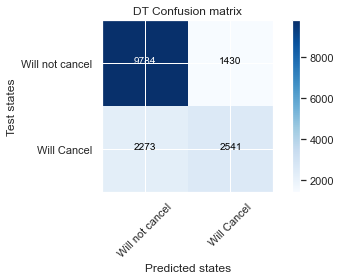

In [57]:
cnf_matrix = confusion_matrix(y_test, test_labels)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Will not cancel', 'Will Cancel'],
                      title='DT Confusion matrix')

In [63]:
def plot_tree(model):
    dot_data = export_graphviz(model,
                               feature_names=X_train.columns,  
                               class_names=["Will not cancel", "Will Cancel"],
                               filled=True)
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    pydot_graph.set_size('"20,20"')
    return graphviz.Source(pydot_graph.to_string())

In [64]:
plot_tree(DT)

## Support Vector Machines

In [31]:
SVM=svm.SVC(kernel='rbf', C=10, gamma=0.01, probability=True )
SVM.fit(X = X_train, y = y_train)
test_labels = SVM.predict(X_test)
train_labels=SVM.predict(X_train)

In [32]:
metrics(y_train, train_labels , y_test, test_labels)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.92      0.86     26158
           1       0.74      0.49      0.59     11227

    accuracy                           0.79     37385
   macro avg       0.77      0.71      0.73     37385
weighted avg       0.79      0.79      0.78     37385

[[24164  1994]
 [ 5689  5538]]
___________________________________________________________________________________________________________
                                                TEST                                                       
------------------------------------------------------------------------------------------------------

Confusion matrix
[[10278   936]
 [ 2533  2281]]


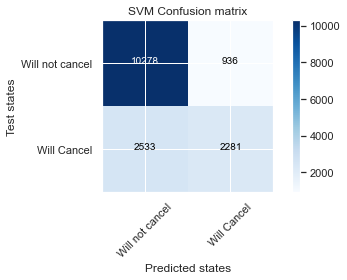

In [33]:
cnf_matrix = confusion_matrix(y_test, test_labels)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Will not cancel', 'Will Cancel'],
                      title='SVM Confusion matrix')

## RandomForest

In [75]:
rf = RandomForestClassifier()
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 1000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
#Criterion:
criterion= ['entropy', 'auto']
# Create the random grid
rf_rand_par = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
              'criterion': criterion}
pprint(rf_rand_par)

{'bootstrap': [True, False],
 'criterion': ['entropy', 'auto'],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000]}


In [76]:
RF_grid = RandomizedSearchCV(estimator = rf, param_distributions = rf_rand_par, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
RF_grid.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['entropy', 'auto'],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [10, 120, 230, 340, 450,
                                                         560, 670, 780, 890,
                                                         1000]},
                   random_state=42, verbose=2)

In [77]:
RF_grid.best_params_

{'n_estimators': 1000,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 30,
 'criterion': 'entropy',
 'bootstrap': False}

In [78]:
RF = RF_grid.best_estimator_
RF.fit(X = X_train, y = y_train)
test_labels = RF.predict(X_test)
train_labels=RF.predict(X_train)

In [79]:
metrics(y_train, train_labels , y_test, test_labels)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     26158
           1       0.92      0.81      0.86     11227

    accuracy                           0.92     37385
   macro avg       0.92      0.89      0.90     37385
weighted avg       0.92      0.92      0.92     37385

[[25344   814]
 [ 2133  9094]]
___________________________________________________________________________________________________________
                                                TEST                                                       
------------------------------------------------------------------------------------------------------

Confusion matrix
[[10136  1078]
 [ 2095  2719]]


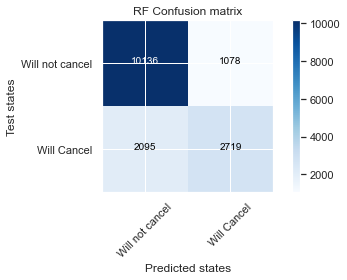

In [80]:
cnf_matrix = confusion_matrix(y_test, test_labels)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Will not cancel', 'Will Cancel'],
                      title='RF Confusion matrix')

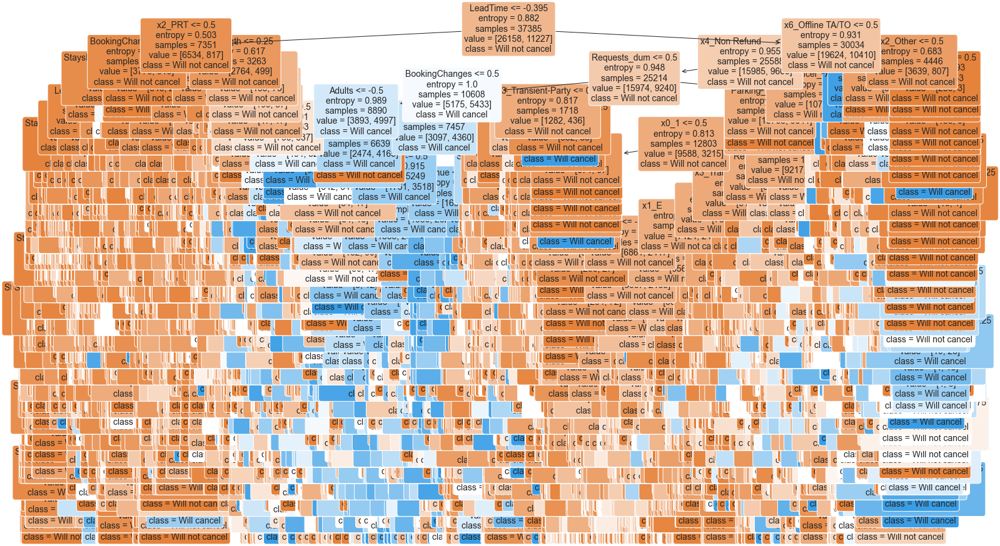

In [82]:
import pydot
# Pull out one tree from the forest
Tree = RF.estimators_[5]
# Export the image to a dot file
from sklearn import tree
plt.figure(figsize=(25,15))
tree.plot_tree(Tree,filled=True, 
              rounded=True, feature_names = X_train.columns, class_names=['Will not cancel', 
                                        'Will cancel'],
              fontsize=14);

## Gboost

In [16]:
cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats = 3, random_state = 1)
def return_f1score(model, X, y):
    n_scores = cross_val_score(model, X, y, scoring = 'f1', cv = cv)
    return n_scores
def return_results(models):
    results, names = [],[]
    for name, model in models.items():
        scores = return_f1score(model, X_train, y_train)
        results.append(scores)
        names.append(name)
        print('>%s %.3f (%.3f)' % (name, scores.mean(), scores.std()))
    
    plt.figure(figsize=(15,7))
    plt.boxplot(results, labels = names, showmeans = True)
    plt.xticks(fontsize=14)
    plt.show()

#### Learning Rate

>0.001 0.000 (0.000)
>0.01 0.100 (0.015)
>0.1 0.597 (0.015)
>0.3 0.631 (0.011)
>0.5 0.638 (0.012)
>0.8 0.639 (0.013)
>1.0 0.637 (0.010)


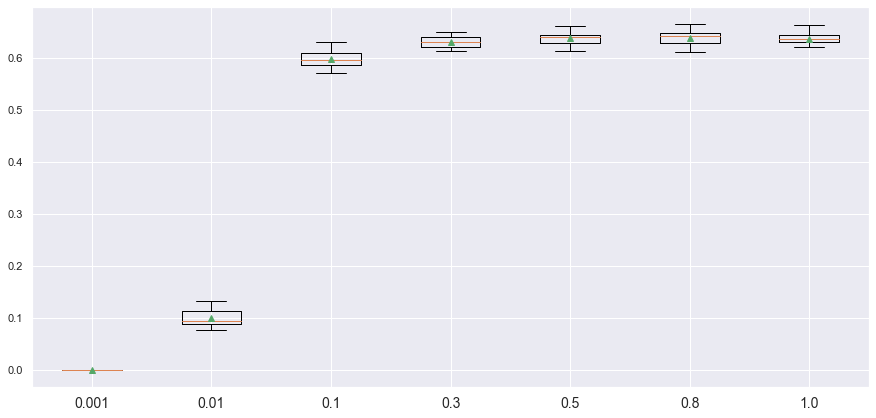

In [17]:
#Learning Rate

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = GradientBoostingClassifier(learning_rate = value, random_state = 15)      
    return models

models = get_models([0.001, 0.01, 0.1, 0.3, 0.5, 0.8, 1.0])
return_results(models)

#### n_estimators

>2 0.560 (0.016)
>5 0.584 (0.015)
>10 0.597 (0.014)
>20 0.618 (0.012)
>30 0.626 (0.011)
>50 0.633 (0.011)
>100 0.639 (0.013)
>150 0.640 (0.011)
>200 0.641 (0.011)
>500 0.642 (0.010)


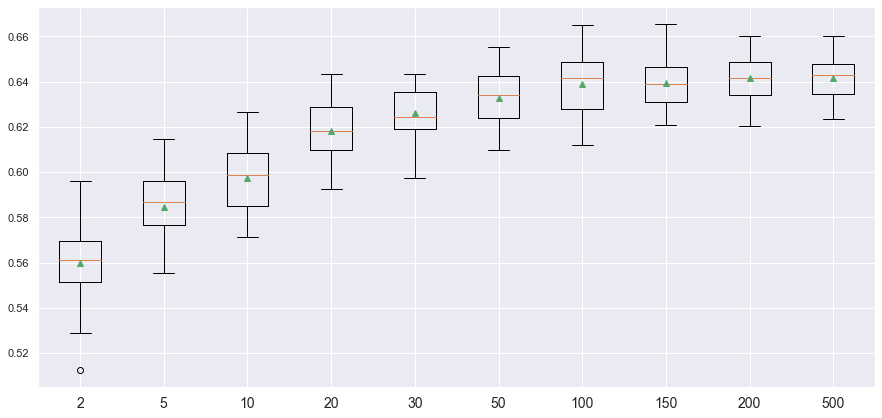

In [18]:
# n_estimators
def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = GradientBoostingClassifier(n_estimators = value,learning_rate = 0.8, random_state = 15)      
    return models

models = get_models([2,5,10,20,30,50,100,150,200,500])
return_results(models)

#### Max Depth

>2 0.565 (0.011)
>3 0.592 (0.014)
>5 0.622 (0.013)
>10 0.648 (0.012)
>15 0.646 (0.010)


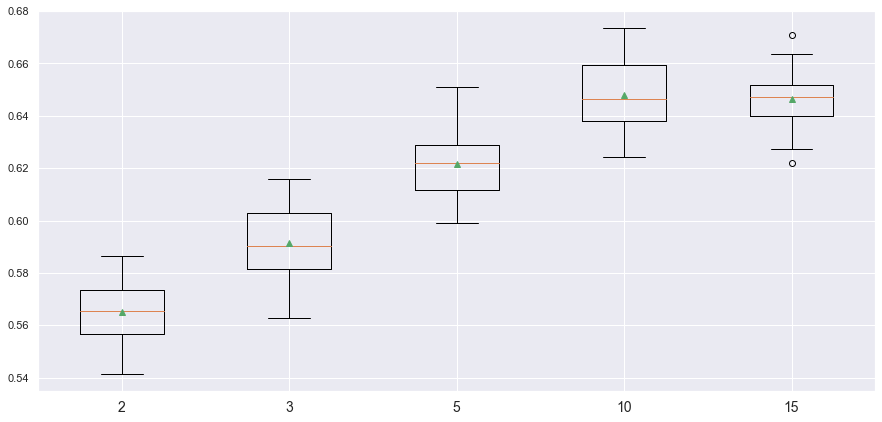

In [26]:
#max_depth: 
def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = GradientBoostingClassifier(n_estimators =80, max_depth=value, random_state = 15)      
    return models

models = get_models([2,3,5,10,15])
return_results(models)

In [29]:
gb = GradientBoostingClassifier(learning_rate= 0.8, n_estimators =150, random_state = 5)
gb.fit(X = X_train, y = y_train)
test_labels = gb.predict(X_test)
train_labels=gb.predict(X_train)

In [30]:
metrics(y_train, train_labels , y_test, test_labels)

___________________________________________________________________________________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.92      0.89     26158
           1       0.77      0.64      0.70     11227

    accuracy                           0.83     37385
   macro avg       0.81      0.78      0.79     37385
weighted avg       0.83      0.83      0.83     37385

[[23979  2179]
 [ 4038  7189]]
___________________________________________________________________________________________________________
                                                TEST                                                       
------------------------------------------------------------------------------------------------------

Confusion matrix
[[9988 1226]
 [2021 2793]]


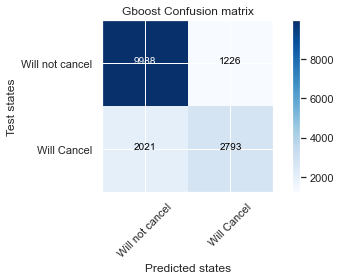

In [25]:
cnf_matrix = confusion_matrix(y_test, test_labels)
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Will not cancel', 'Will Cancel'],
                      title='Gboost Confusion matrix')

### ROC CURVE: 

In [ ]:
from sklearn import metrics
# Add the models to the list that you want to view on the ROC plot
models = [
{
    'label': 'Logistic Regression',
    'model': LogisticRegression(C=1, penalty='l2'),
},
{
    'label': 'K-nearest neighbor',
    'model': KNeighborsClassifier(n_neighbors=22, metric='manhattan'),
}, 
    
    {
    'label': 'Support Vector Machine',
    'model': svm.SVC(kernel='rbf', C=10, gamma=0.01, probability=True),
} ,  
 {
    'label': 'Decision Tree',
    'model': DecisionTreeClassifier(criterion='entropy', max_depth= 20, max_features='auto', max_leaf_nodes=None,
     min_samples_leaf= 1, min_samples_split= 2,  splitter= 'best', random_state=14)
} , 
    
    {
    'label': 'Random Forest',
    'model': RandomForestClassifier(n_estimators = 1000, criterion = 'entropy', min_samples_split= 10, min_samples_leaf= 1, 
                          max_features= 'auto', max_depth= 30, bootstrap= False, random_state = 42)
}, 
    
    {
    'label': 'Gradient Boosting Classifier',
    'model': GradientBoostingClassifier(n_estimators =80, subsample = 0.8,
                                                        max_features = 0.5, min_samples_split=1000,
                                                         min_samples_leaf= 70, random_state = 15)
}
    
    
    
]

# Below for loop iterates through your models list
for m in models:
    model = m['model'] # select the model
    model.fit(X_train, y_train) # train the model
    y_pred=model.predict(X_test) # predict the test data
# Compute False postive rate, and True positive rate
    fpr, tpr, thresholds = metrics.roc_curve(y_test, model.predict_proba(X_test)[:,1])
# Calculate Area under the curve to display on the plot
    auc = metrics.roc_auc_score(y_test,model.predict(X_test))
# Now, plot the computed values
    plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (m['label'], auc))
# Custom settings for the plot 
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1-Specificity(False Positive Rate)')
plt.ylabel('Sensitivity(True Positive Rate)')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()   # Display